<font size="8">Analysis of toxo-infected organoids</font>

# Environment

In [1]:
import ipynbname
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy.external as sce
from datetime import datetime
import decoupler as dc
import os

In [2]:
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=100)
sc.logging.print_header()

scanpy==1.8.1 anndata==0.7.6 umap==0.4.6 numpy==1.20.2 scipy==1.6.3 pandas==1.2.4 scikit-learn==1.0.1 statsmodels==0.13.0 python-igraph==0.9.7 louvain==0.7.0 pynndescent==0.5.5


In [3]:
print(datetime.now())

2022-12-02 13:03:02.837856


In [4]:
msigdb = dc.get_resource('MSigDB')
msigdb

,genesymbol,collection,geneset
0,MSC,oncogenic_signatures,PKCA_DN.V1_DN
1,MSC,mirna_targets,MIR12123
2,MSC,chemical_and_genetic_perturbations,NIKOLSKY_BREAST_CANCER_8Q12_Q22_AMPLICON
3,MSC,immunologic_signatures,GSE32986_UNSTIM_VS_GMCSF_AND_CURDLAN_LOWDOSE_S...
4,MSC,chemical_and_genetic_perturbations,BENPORATH_PRC2_TARGETS
...,...,...,...
2407729,OR2W5P,immunologic_signatures,GSE22601_DOUBLE_NEGATIVE_VS_CD8_SINGLE_POSITIV...
2407730,OR2W5P,immunologic_signatures,KANNAN_BLOOD_2012_2013_TIV_AGE_65PLS_REVACCINA...
2407731,OR52L2P,immunologic_signatures,GSE22342_CD11C_HIGH_VS_LOW_DECIDUAL_MACROPHAGE...
2407732,CSNK2A3,immunologic_signatures,OCONNOR_PBMC_MENVEO_ACWYVAX_AGE_30_70YO_7DY_AF...


In [5]:
curated = msigdb[msigdb['collection'].isin(['reactome_pathways', 'kegg_pathways'])]
curated = curated[~curated.duplicated(['geneset', 'genesymbol'])]
curated.geneset.unique()

array(['REACTOME_COSTIMULATION_BY_THE_CD28_FAMILY',
       'KEGG_CELL_ADHESION_MOLECULES_CAMS',
       'KEGG_INTESTINAL_IMMUNE_NETWORK_FOR_IGA_PRODUCTION', ...,
       'REACTOME_RUNX2_REGULATES_CHONDROCYTE_MATURATION',
       'REACTOME_SODIUM_COUPLED_SULPHATE_DI_AND_TRI_CARBOXYLATE_TRANSPORTERS',
       'REACTOME_SYNTHESIS_OF_PIPS_AT_THE_ER_MEMBRANE'], dtype=object)

In [6]:
aggregated = curated[["geneset", "genesymbol"]].groupby("geneset").count()
curated = curated[~curated.geneset.isin(aggregated[aggregated.genesymbol > 100].index.tolist())]

In [7]:
data_folder = "./data"
result_folder = './results'

# Data Load

In [8]:
adata = sc.read(os.path.join(data_folder, "annotated_dataset_human.h5ad"))

In [9]:
adata.shape 

(25321, 16240)

In [10]:
adata.obs['batch_id'].value_counts()

CNT      9599
MECP2    9124
HA       6598
Name: batch_id, dtype: int64

In [11]:
#adata.obs 
print('Number of cells:', adata.n_obs) 
print('Number of genes:', adata.n_vars) 

Number of cells: 25321
Number of genes: 16240


In [12]:
N_clusters = adata[adata.obs["celltype"].isin(['N1', 'N2', 'N3'])].copy()
N_clusters

/usr/local/lib/python3.8/dist-packages/anndata/compat/__init__.py:211: FutureWarning: During AnnData slicing, found matrix at .uns['triku_params']['None']['knn_array'] that happens to be dimensioned at n_obs×n_obs (25321×25321).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(


AnnData object with n_obs × n_vars = 7693 × 16240
    obs: 'batch_id', 'sample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_mito', 'pct_counts_mito', 'total_counts_toxo', 'pct_counts_toxo', 'total_counts_human', 'pct_counts_human', 'total_counts_HA', 'pct_counts_HA', 'total_counts_Mecp2', 'pct_counts_Mecp2', 'n_genes', 'n_counts', 'umap_density_batch_id', 'Leiden_03', 'Leiden_04', 'Leiden_05', 'Leiden_06', 'infected', 'batch_infect', 'celltype', 'sample_infect'
    var: 'gene_ids', 'feature_types', 'ribo', 'mito', 'toxo', 'human', 'HA', 'Mecp2', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'triku_distance', 'triku_distance_uncorrected', 'triku_highly_variable'
    uns: 'Leiden_03_colors', 'Leiden_04_colors', 'Leiden_05_colors', 'Leiden_06_colors', 'batch_id_colors', 'celltype_colors', 'diffmap_evals', 'draw_graph', 'infected_colors', 'leiden', 'neighbors', 'pca', 'rank_L06', 'sample_id

In [13]:
N_clusters.layers['scaled'] = sc.pp.scale(N_clusters, copy=True).X

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [14]:
N_TOP_GENES = 500

In [15]:
P_THRESHOLD = 0.001

# Differential expression

## Differential expression **MECP2** vs  **HA batch** batch neurons

In [16]:
sc.tl.rank_genes_groups(N_clusters, 'batch_id', groups=["MECP2"], reference="HA", method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:07)


In [17]:
degs_table = sc.get.rank_genes_groups_df(N_clusters, group="MECP2")
degs_table

,names,scores,logfoldchanges,pvals,pvals_adj
0,HIST1H1E,50.758415,3.046582,0.000000e+00,0.000000e+00
1,EIF4G2,41.221760,0.851842,0.000000e+00,0.000000e+00
2,MT-ATP8,38.032070,1.846891,0.000000e+00,0.000000e+00
3,PJA2,37.357212,1.142790,1.936287e-305,2.620441e-302
4,MAP2,34.147476,0.847427,1.457593e-255,1.392430e-252
...,...,...,...,...,...
16235,RPL37,-39.528629,-0.662308,0.000000e+00,0.000000e+00
16236,RPL36,-39.661987,-0.684296,0.000000e+00,0.000000e+00
16237,RPL38,-44.700375,-0.831514,0.000000e+00,0.000000e+00
16238,RPS29,-45.734119,-0.800646,0.000000e+00,0.000000e+00


In [18]:
degs_table.to_csv(os.path.join(result_folder, "neurons_MECP2vsHA_DEGS.csv"))

In [19]:
"up-regulated:, ", len(degs_table[(degs_table.pvals_adj < 0.01) & (degs_table.logfoldchanges > 0)])

('up-regulated:, ', 3660)

In [20]:
"down-regulated:, ", len(degs_table[(degs_table.pvals_adj < 0.01) & (degs_table.logfoldchanges < 0)])

('down-regulated:, ', 1791)

In [21]:
rank = pd.DataFrame()
rank["score"] = -np.sign(degs_table.set_index("names").logfoldchanges) * np.log10(degs_table.set_index("names").pvals_adj + 1.E-300)
rank.sort_values(by="score")

,score
names,
RPL37A,-300.000000
RPS21,-300.000000
RPS27,-300.000000
RPS29,-300.000000
RPL36,-300.000000
...,...
MAP2,251.856227
PJA2,299.988766
MT-ATP8,300.000000


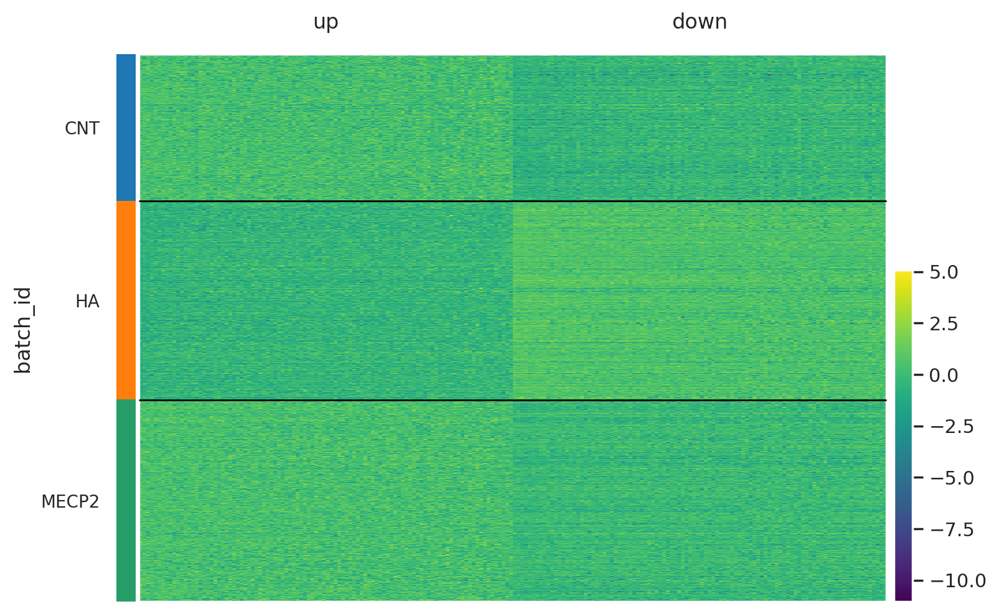

In [22]:
up = rank.sort_values(by="score", ascending=False).head(100).index.tolist()
down = rank.sort_values(by="score", ascending=True).head(100).index.tolist()
sns.set()
sc.pl.heatmap(N_clusters, {"up": up, "down": down}, groupby='batch_id', swap_axes=False, layer="scaled", cmap="viridis")

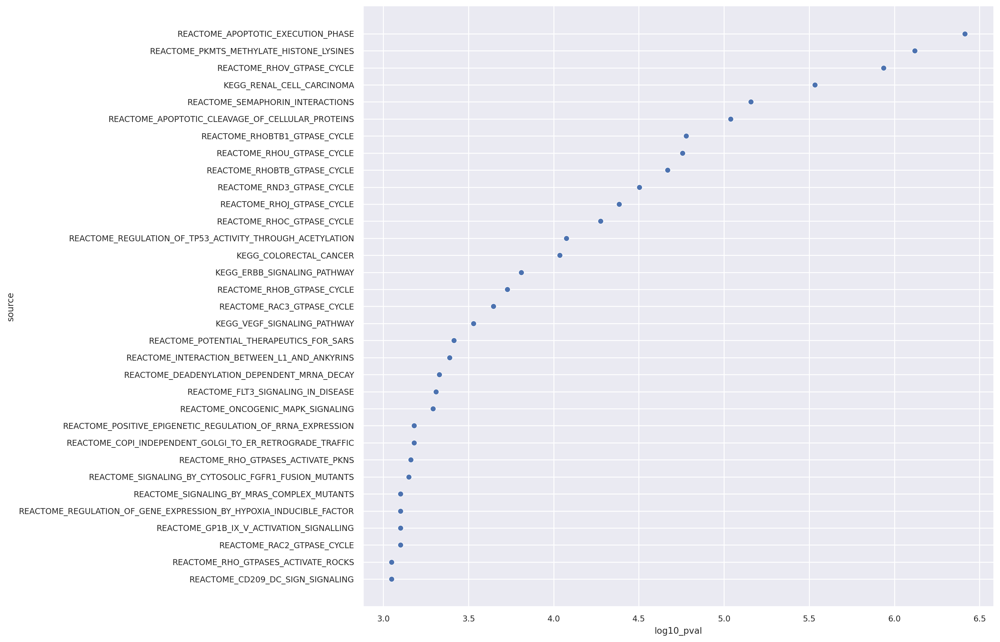

In [23]:
pthreshold = P_THRESHOLD
n_up = N_TOP_GENES
n_bottom = 0

estimate, pvals = dc.run_ora(mat=rank.T, net=curated, source='geneset', target='genesymbol', verbose=False, n_up=n_up, n_bottom=n_bottom)
ora = pd.concat([estimate, pvals]).T
ora.columns = ["estimate", "pvals"]
ora["log10_pval"] = -np.log10(ora["pvals"])
ora = ora.reset_index()

sns.set(font_scale=0.8) 
height = 3+len(ora[ora.pvals < pthreshold])*0.2
ax = sns.relplot(data=ora[ora.pvals < pthreshold].sort_values(by="log10_pval", ascending=False), x="log10_pval", y="source", 
                 height=height, aspect=15/height, legend="auto")

In [24]:
ora[ora.source.str.contains("MECP2")]

,source,estimate,pvals,log10_pval
695,REACTOME_LOSS_OF_FUNCTION_OF_MECP2_IN_RETT_SYN...,-0.000000,1.000000,-0.000000
697,REACTOME_LOSS_OF_MECP2_BINDING_ABILITY_TO_THE_...,-0.000000,1.000000,-0.000000
713,REACTOME_MECP2_REGULATES_NEURONAL_RECEPTORS_AN...,1.178867,0.066242,1.178867
714,REACTOME_MECP2_REGULATES_TRANSCRIPTION_OF_NEUR...,-0.000000,1.000000,-0.000000
1005,REACTOME_REGULATION_OF_MECP2_EXPRESSION_AND_AC...,0.764141,0.172131,0.764141
1325,REACTOME_TRANSCRIPTIONAL_REGULATION_BY_MECP2,1.314745,0.048446,1.314745


In [25]:
ora[ora.pvals < 1].to_csv(os.path.join(result_folder, "neurons_MECP2vsHA_funct_TOP{}.csv".format(N_TOP_GENES)))

/usr/local/lib/python3.8/dist-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


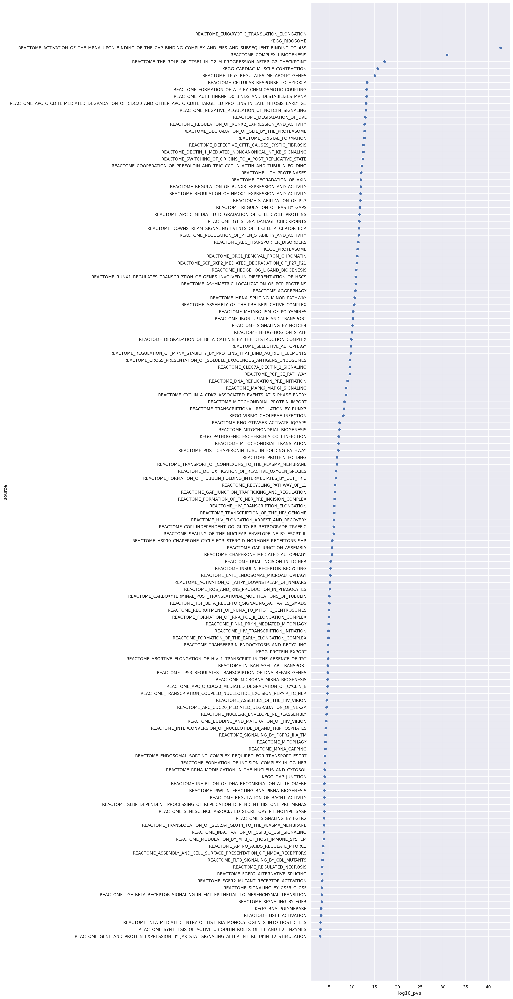

In [26]:
pthreshold = P_THRESHOLD
n_up = 0
n_bottom = N_TOP_GENES

estimate, pvals = dc.run_ora(mat=rank.T, net=curated, source='geneset', target='genesymbol', verbose=False, n_up=n_up, n_bottom=n_bottom)
ora = pd.concat([estimate, pvals]).T
ora.columns = ["estimate", "pvals"]
ora["log10_pval"] = -np.log10(ora["pvals"])
ora = ora.reset_index()

sns.set(font_scale=0.8)
height = 3+len(ora[ora.pvals < pthreshold])*0.2
ax = sns.relplot(data=ora[ora.pvals < pthreshold].sort_values(by="log10_pval", ascending=False), x="log10_pval", y="source", 
                 height=height, aspect=15/height, legend="auto")

In [27]:
ora[ora.source.str.contains("MECP2")]

,source,estimate,pvals,log10_pval
695,REACTOME_LOSS_OF_FUNCTION_OF_MECP2_IN_RETT_SYN...,-0.0,1.0,-0.0
697,REACTOME_LOSS_OF_MECP2_BINDING_ABILITY_TO_THE_...,-0.0,1.0,-0.0
713,REACTOME_MECP2_REGULATES_NEURONAL_RECEPTORS_AN...,-0.0,1.0,-0.0
714,REACTOME_MECP2_REGULATES_TRANSCRIPTION_OF_NEUR...,-0.0,1.0,-0.0
1005,REACTOME_REGULATION_OF_MECP2_EXPRESSION_AND_AC...,-0.0,1.0,-0.0
1325,REACTOME_TRANSCRIPTIONAL_REGULATION_BY_MECP2,-0.0,1.0,-0.0


In [28]:
ora[ora.pvals < 1].to_csv(os.path.join(result_folder, "neurons_MECP2vsHA_funct_BOTTOM{}.csv".format(N_TOP_GENES)))

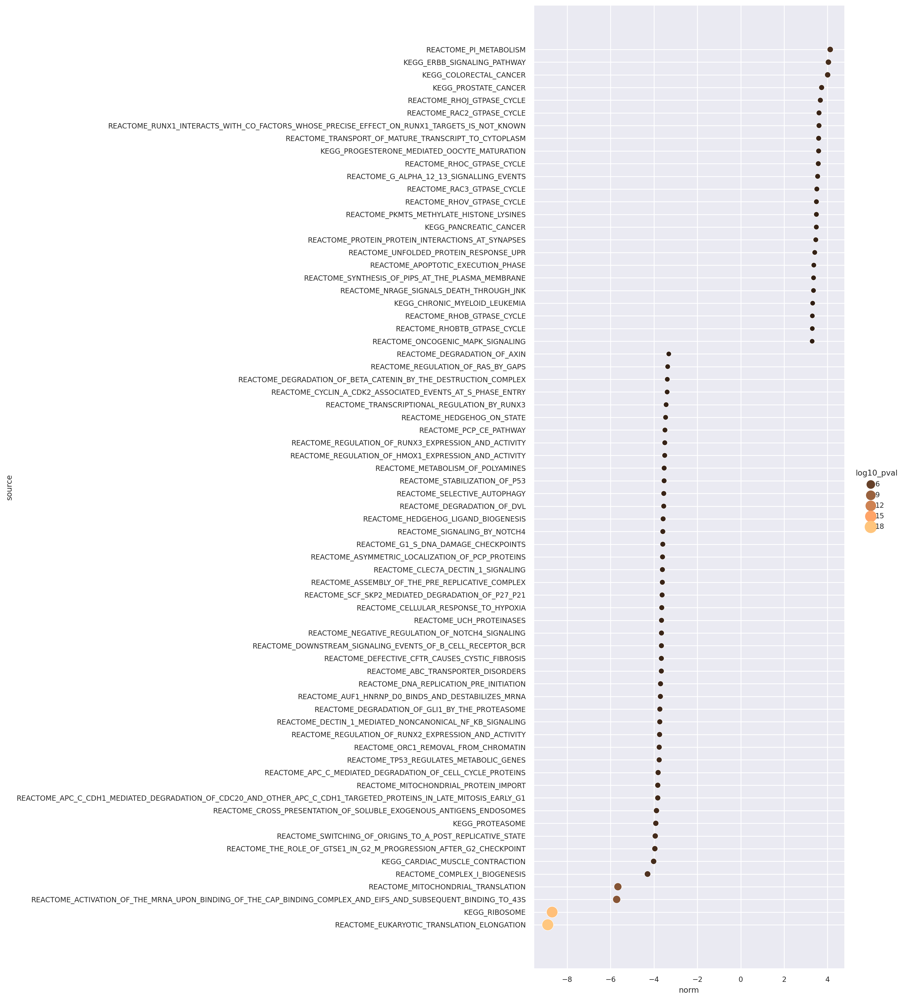

In [29]:
pthreshold = P_THRESHOLD

estimate, norm, pvals = dc.run_gsea(mat=rank.T, net=curated, source='geneset', target='genesymbol', verbose=False)
ora = pd.concat([estimate, norm, pvals]).T
ora.columns = ["estimate", "norm", "pvals"]
ora["log10_pval"] = -np.log10(ora["pvals"])
ora = ora.reset_index()

sns.set(font_scale=0.8)
maxv, minv = ora["log10_pval"].max(), ora["log10_pval"].min()
height = 3+len(ora[ora.pvals < pthreshold])*0.2
ax = sns.relplot(data=ora[ora.pvals < pthreshold].sort_values(by="norm", ascending=False), x="norm", y="source", size="log10_pval", 
                 sizes=(10,200), size_norm=(minv, maxv), 
                 hue="log10_pval", hue_norm=(minv, maxv), palette="copper", 
                 height=height, aspect=15/height, legend="auto")

In [30]:
ora[ora.source.str.contains("MECP2")]

,source,estimate,norm,pvals,log10_pval
695,REACTOME_LOSS_OF_FUNCTION_OF_MECP2_IN_RETT_SYN...,0.765665,2.172617,0.029809,1.525651
697,REACTOME_LOSS_OF_MECP2_BINDING_ABILITY_TO_THE_...,0.790854,1.821270,0.068566,1.163893
713,REACTOME_MECP2_REGULATES_NEURONAL_RECEPTORS_AN...,0.834958,1.798270,0.072134,1.141859
714,REACTOME_MECP2_REGULATES_TRANSCRIPTION_OF_NEUR...,0.761118,1.551559,0.120768,0.918049
1005,REACTOME_REGULATION_OF_MECP2_EXPRESSION_AND_AC...,0.811043,3.110447,0.001868,2.728613
1325,REACTOME_TRANSCRIPTIONAL_REGULATION_BY_MECP2,0.812322,3.191265,0.001417,2.848779


In [31]:
ora[ora.pvals < 1].to_csv(os.path.join(result_folder, "neurons_MECP2vsHA_funct_GSEA.csv"))

## Differential expression **MECP2 batch** vs **CNT batch** **neurons**

In [32]:
sc.tl.rank_genes_groups(N_clusters, 'batch_id', groups=["MECP2"], reference="CNT", method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:06)


In [33]:
degs_table = sc.get.rank_genes_groups_df(N_clusters, group="MECP2")
degs_table

,names,scores,logfoldchanges,pvals,pvals_adj
0,TPI1,22.710808,0.704769,3.503485e-114,1.818899e-110
1,RPL41,20.986553,0.320212,8.703146e-98,2.355651e-94
2,ENO1,20.936621,0.730763,2.484718e-97,5.764546e-94
3,HK2,20.832493,1.896357,2.197208e-96,4.460331e-93
4,MIF,20.686073,0.393501,4.623669e-95,8.343153e-92
...,...,...,...,...,...
16235,MT-CO2,-17.791771,-0.466262,8.185102e-71,6.646303e-68
16236,CIRBP,-21.537315,-0.473922,6.962667e-103,2.261474e-99
16237,MT-ATP6,-22.699999,-0.677255,4.480047e-114,1.818899e-110
16238,HSPA6,-24.981174,-2.334100,9.793420e-138,7.952257e-134


In [34]:
degs_table.to_csv(os.path.join(result_folder, "neurons_MECP2vsCNT_DEGS.csv"))

In [35]:
"up-regulated:, ", len(degs_table[(degs_table.pvals_adj < 0.01) & (degs_table.logfoldchanges > 0)])

('up-regulated:, ', 651)

In [36]:
"down-regulated:, ", len(degs_table[(degs_table.pvals_adj < 0.01) & (degs_table.logfoldchanges < 0)])

('down-regulated:, ', 828)

In [37]:
rank = pd.DataFrame()
rank["score"] = -np.sign(degs_table.set_index("names").logfoldchanges) * np.log10(degs_table.set_index("names").pvals_adj + 1.E-300)
rank.sort_values(by="score")

,score
names,
HSPA1A,-167.454928
HSPA6,-133.099510
MT-ATP6,-109.740191
CIRBP,-98.645608
MT-CO2,-67.177420
...,...
MIF,91.078670
HK2,92.350633
ENO1,93.239235


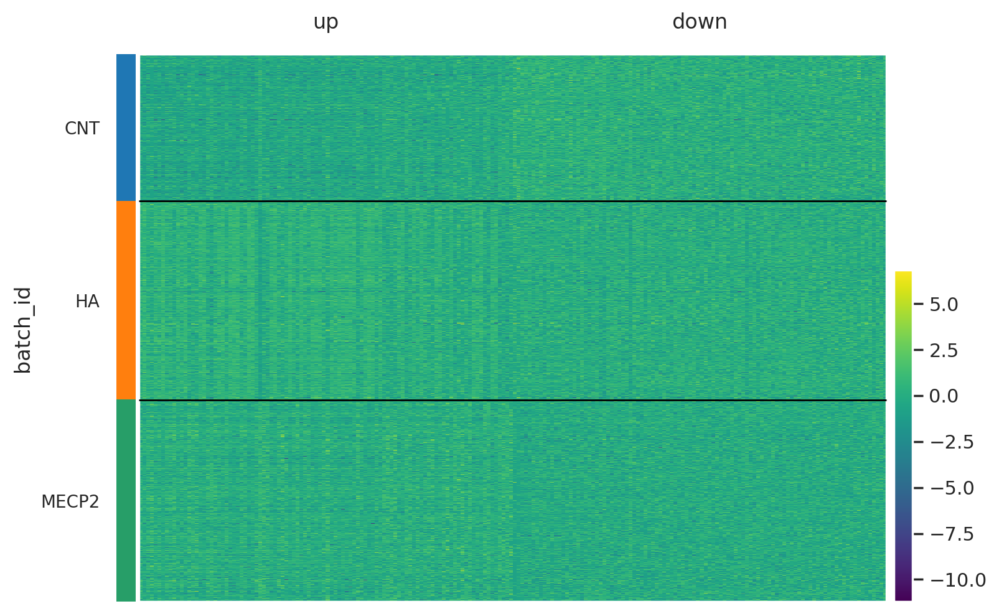

In [38]:
up = rank.sort_values(by="score", ascending=False).head(100).index.tolist()
down = rank.sort_values(by="score", ascending=True).head(100).index.tolist()
sns.set()
sc.pl.heatmap(N_clusters, {"up": up, "down": down}, groupby='batch_id', swap_axes=False, layer="scaled", cmap="viridis")

/usr/local/lib/python3.8/dist-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


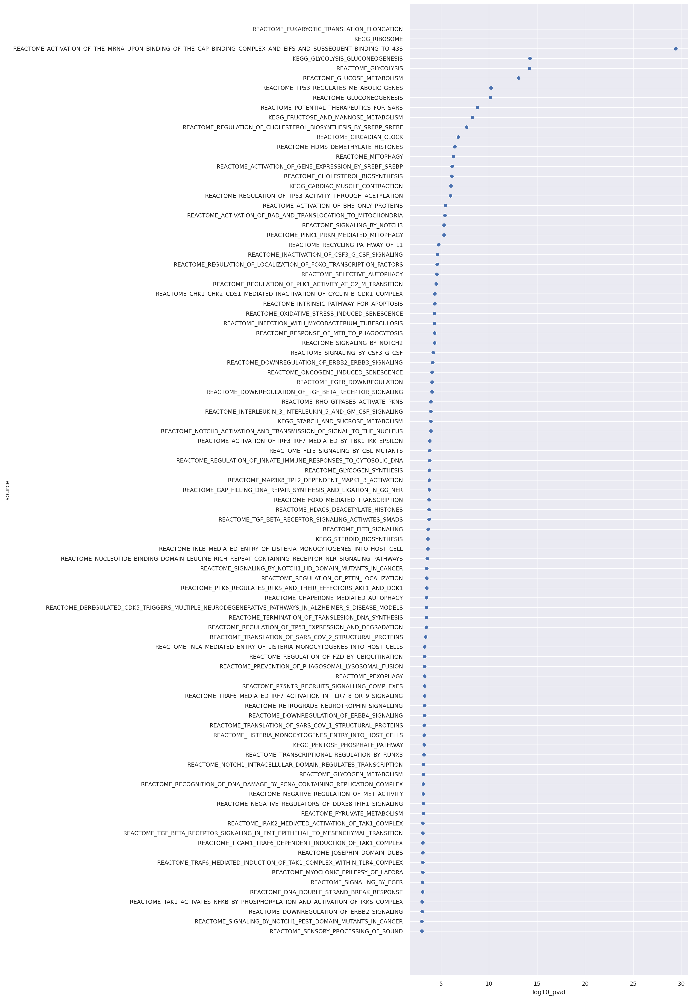

In [39]:
pthreshold = P_THRESHOLD
n_up = N_TOP_GENES
n_bottom = 0

estimate, pvals = dc.run_ora(mat=rank.T, net=curated, source='geneset', target='genesymbol', verbose=False, n_up=n_up, n_bottom=n_bottom)
ora = pd.concat([estimate, pvals]).T
ora.columns = ["estimate", "pvals"]
ora["log10_pval"] = -np.log10(ora["pvals"])
ora = ora.reset_index()

sns.set(font_scale=0.8) 
height = 3+len(ora[ora.pvals < pthreshold])*0.2
ax = sns.relplot(data=ora[ora.pvals < pthreshold].sort_values(by="log10_pval", ascending=False), x="log10_pval", y="source", 
                 height=height, aspect=15/height, legend="auto")

In [40]:
ora[ora.source.str.contains("MECP2")]

,source,estimate,pvals,log10_pval
546,REACTOME_LOSS_OF_FUNCTION_OF_MECP2_IN_RETT_SYN...,0.650305,0.223715,0.650305
557,REACTOME_MECP2_REGULATES_NEURONAL_RECEPTORS_AN...,1.609491,0.024576,1.609491
558,REACTOME_MECP2_REGULATES_TRANSCRIPTION_OF_NEUR...,-0.000000,1.000000,-0.000000
792,REACTOME_REGULATION_OF_MECP2_EXPRESSION_AND_AC...,0.983819,0.103796,0.983819
1041,REACTOME_TRANSCRIPTIONAL_REGULATION_BY_MECP2,1.918067,0.012076,1.918067


In [41]:
ora[ora.pvals < 1].to_csv(os.path.join(result_folder, "neurons_MECP2vsCNT_funct_TOP{}.csv".format(N_TOP_GENES)))

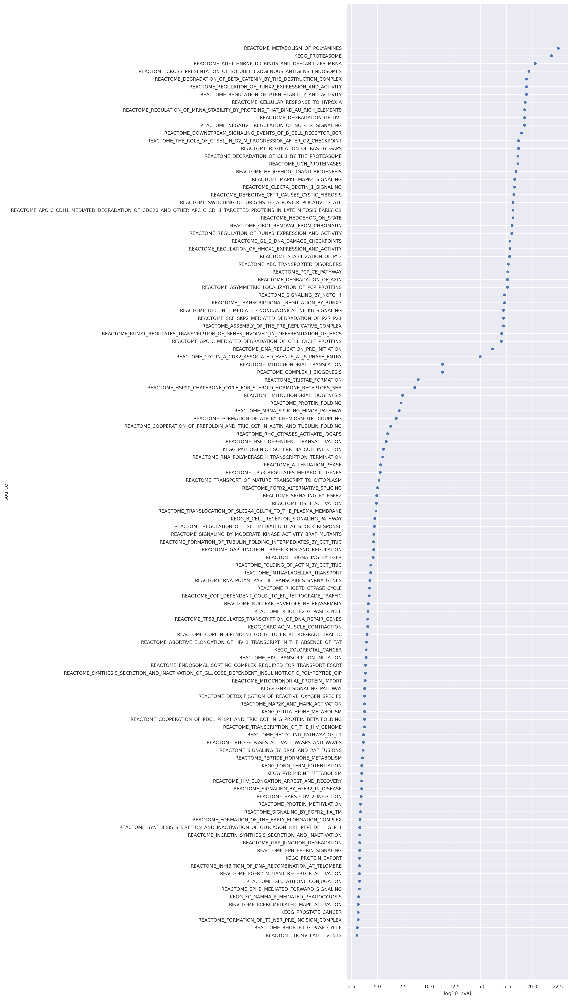

In [42]:
pthreshold = P_THRESHOLD
n_up = 0
n_bottom = N_TOP_GENES

estimate, pvals = dc.run_ora(mat=rank.T, net=curated, source='geneset', target='genesymbol', verbose=False, n_up=n_up, n_bottom=n_bottom)
ora = pd.concat([estimate, pvals]).T
ora.columns = ["estimate", "pvals"]
ora["log10_pval"] = -np.log10(ora["pvals"])
ora = ora.reset_index()

sns.set(font_scale=0.8)
height = 3+len(ora[ora.pvals < pthreshold])*0.2
ax = sns.relplot(data=ora[ora.pvals < pthreshold].sort_values(by="log10_pval", ascending=False), x="log10_pval", y="source", 
                 height=height, aspect=15/height, legend="auto")

In [43]:
ora[ora.pvals < 1].to_csv(os.path.join(result_folder, "neurons_MECP2vsCNT_funct_BOTTOM{}.csv".format(N_TOP_GENES)))

In [44]:
ora[ora.source.str.contains("MECP2")]

,source,estimate,pvals,log10_pval
546,REACTOME_LOSS_OF_FUNCTION_OF_MECP2_IN_RETT_SYN...,0.650305,0.223715,0.650305
557,REACTOME_MECP2_REGULATES_NEURONAL_RECEPTORS_AN...,-0.000000,1.000000,-0.000000
558,REACTOME_MECP2_REGULATES_TRANSCRIPTION_OF_NEUR...,-0.000000,1.000000,-0.000000
792,REACTOME_REGULATION_OF_MECP2_EXPRESSION_AND_AC...,0.983819,0.103796,0.983819
1041,REACTOME_TRANSCRIPTIONAL_REGULATION_BY_MECP2,0.643997,0.226988,0.643997


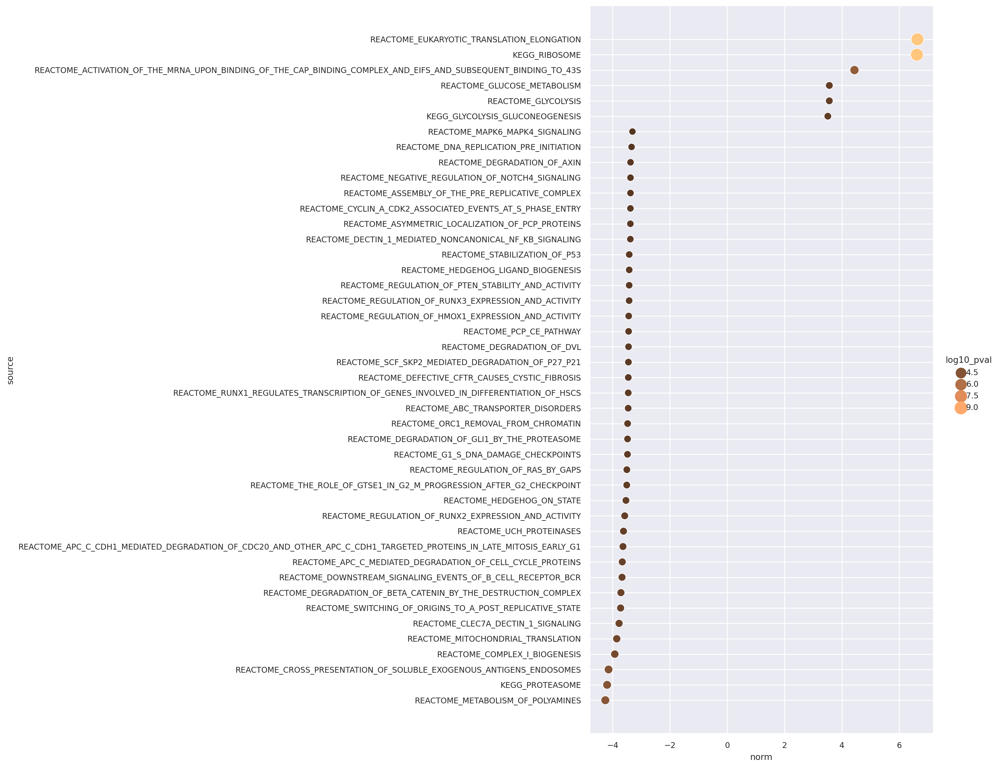

In [45]:
pthreshold = P_THRESHOLD

estimate, norm, pvals = dc.run_gsea(mat=rank.T, net=curated, source='geneset', target='genesymbol', verbose=False)
ora = pd.concat([estimate, norm, pvals]).T
ora.columns = ["estimate", "norm", "pvals"]
ora["log10_pval"] = -np.log10(ora["pvals"])
ora = ora.reset_index()

sns.set(font_scale=0.8)
maxv, minv = ora["log10_pval"].max(), ora["log10_pval"].min()
height = 3+len(ora[ora.pvals < pthreshold])*0.2
ax = sns.relplot(data=ora[ora.pvals < pthreshold].sort_values(by="norm", ascending=False), x="norm", y="source", size="log10_pval", 
                 sizes=(10,200), size_norm=(minv, maxv), 
                 hue="log10_pval", hue_norm=(minv, maxv), palette="copper", 
                 height=height, aspect=15/height, legend="auto")

In [46]:
ora[ora.pvals < 1].to_csv(os.path.join(result_folder, "neurons_MECP2vsCNT_funct_GSEA.csv"))

In [47]:
ora[ora.source.str.contains("MECP2")]

,source,estimate,norm,pvals,log10_pval
546,REACTOME_LOSS_OF_FUNCTION_OF_MECP2_IN_RETT_SYN...,-0.425060,-1.014259,0.310459,0.507996
557,REACTOME_MECP2_REGULATES_NEURONAL_RECEPTORS_AN...,0.814717,1.593913,0.110956,0.954851
558,REACTOME_MECP2_REGULATES_TRANSCRIPTION_OF_NEUR...,0.457467,1.001465,0.316602,0.499486
792,REACTOME_REGULATION_OF_MECP2_EXPRESSION_AND_AC...,-0.410966,-1.375563,0.168957,0.772224
1041,REACTOME_TRANSCRIPTIONAL_REGULATION_BY_MECP2,0.534490,1.568841,0.116685,0.932985


## Differential expression **HA batch** vs **CNT batch neurons**

In [48]:
sc.tl.rank_genes_groups(N_clusters, 'batch_id', groups=["HA"], reference="CNT", method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:06)


In [49]:
degs_table = sc.get.rank_genes_groups_df(N_clusters, group="HA")
degs_table

,names,scores,logfoldchanges,pvals,pvals_adj
0,RPL37A,52.258892,1.073076,0.000000e+00,0.000000e+00
1,RPS29,50.028500,1.065866,0.000000e+00,0.000000e+00
2,RPL38,48.902889,1.123530,0.000000e+00,0.000000e+00
3,RPL41,47.517830,0.848250,0.000000e+00,0.000000e+00
4,RPL36,45.737629,0.955451,0.000000e+00,0.000000e+00
...,...,...,...,...,...
16235,MAP2,-33.993610,-0.922489,2.768887e-253,1.249076e-250
16236,DDX3X,-35.388416,-1.377876,2.573673e-274,1.393215e-271
16237,MT-ATP8,-37.171783,-1.926630,1.950167e-302,1.319613e-299
16238,HIST1H1E,-37.358028,-2.418015,1.878157e-305,1.326142e-302


In [50]:
degs_table.to_csv(os.path.join(result_folder, "neurons_HAvsCNT_DEGS.csv"))

In [51]:
"up-regulated:, ", len(degs_table[(degs_table.pvals_adj < 0.01) & (degs_table.logfoldchanges > 0)])

('up-regulated:, ', 1347)

In [52]:
"down-regulated:, ", len(degs_table[(degs_table.pvals_adj < 0.01) & (degs_table.logfoldchanges < 0)])

('down-regulated:, ', 3414)

In [53]:
rank = pd.DataFrame()
rank["score"] = -np.sign(degs_table.set_index("names").logfoldchanges) * np.log10(degs_table.set_index("names").pvals_adj + 1.E-300)
rank.sort_values(by="score")

,score
names,
EIF4G2,-300.000000
HIST1H1E,-299.994278
MT-ATP8,-298.847830
DDX3X,-270.855982
MAP2,-249.903411
...,...
COX7C,300.000000
RPLP1,300.000000
RPL35A,300.000000


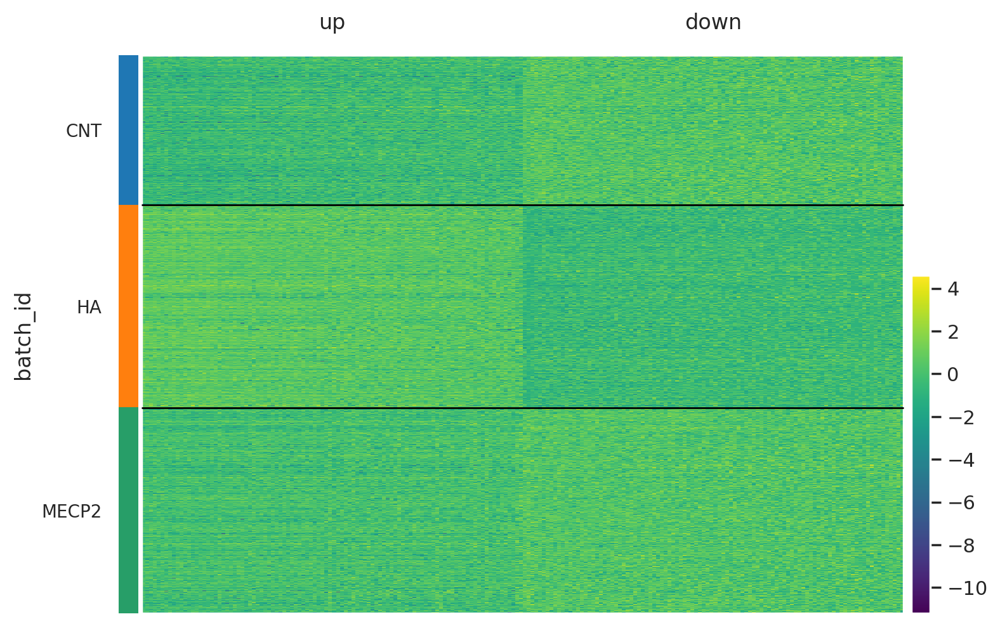

In [54]:
up = rank.sort_values(by="score", ascending=False).head(100).index.tolist()
down = rank.sort_values(by="score", ascending=True).head(100).index.tolist()
sns.set()
sc.pl.heatmap(N_clusters, {"up": up, "down": down}, groupby='batch_id', swap_axes=False, layer="scaled", cmap="viridis")

/usr/local/lib/python3.8/dist-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


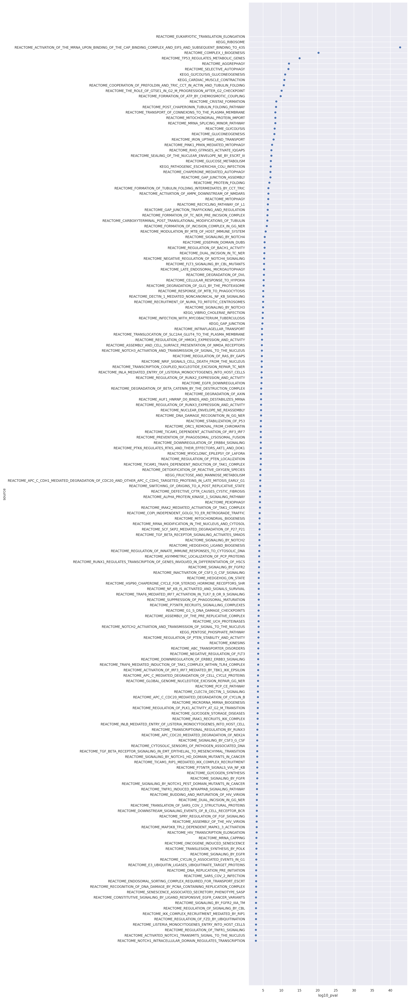

In [55]:
pthreshold = P_THRESHOLD
n_up = N_TOP_GENES
n_bottom = 0

estimate, pvals = dc.run_ora(mat=rank.T, net=curated, source='geneset', target='genesymbol', verbose=False, n_up=n_up, n_bottom=n_bottom)
ora = pd.concat([estimate, pvals]).T
ora.columns = ["estimate", "pvals"]
ora["log10_pval"] = -np.log10(ora["pvals"])
ora = ora.reset_index()

sns.set(font_scale=0.8) 
height = 3+len(ora[ora.pvals < pthreshold])*0.2
ax = sns.relplot(data=ora[ora.pvals < pthreshold].sort_values(by="log10_pval", ascending=False), x="log10_pval", y="source", 
                 height=height, aspect=15/height, legend="auto")

In [56]:
ora[ora.source.str.contains("MECP2")]

,source,estimate,pvals,log10_pval
695,REACTOME_LOSS_OF_FUNCTION_OF_MECP2_IN_RETT_SYN...,-0.0,1.0,-0.0
697,REACTOME_LOSS_OF_MECP2_BINDING_ABILITY_TO_THE_...,-0.0,1.0,-0.0
713,REACTOME_MECP2_REGULATES_NEURONAL_RECEPTORS_AN...,-0.0,1.0,-0.0
714,REACTOME_MECP2_REGULATES_TRANSCRIPTION_OF_NEUR...,-0.0,1.0,-0.0
1005,REACTOME_REGULATION_OF_MECP2_EXPRESSION_AND_AC...,-0.0,1.0,-0.0
1325,REACTOME_TRANSCRIPTIONAL_REGULATION_BY_MECP2,-0.0,1.0,-0.0


In [57]:
ora[ora.pvals < 1].to_csv(os.path.join(result_folder, "neurons_HAvsCNT_funct_TOP{}.csv".format(N_TOP_GENES)))

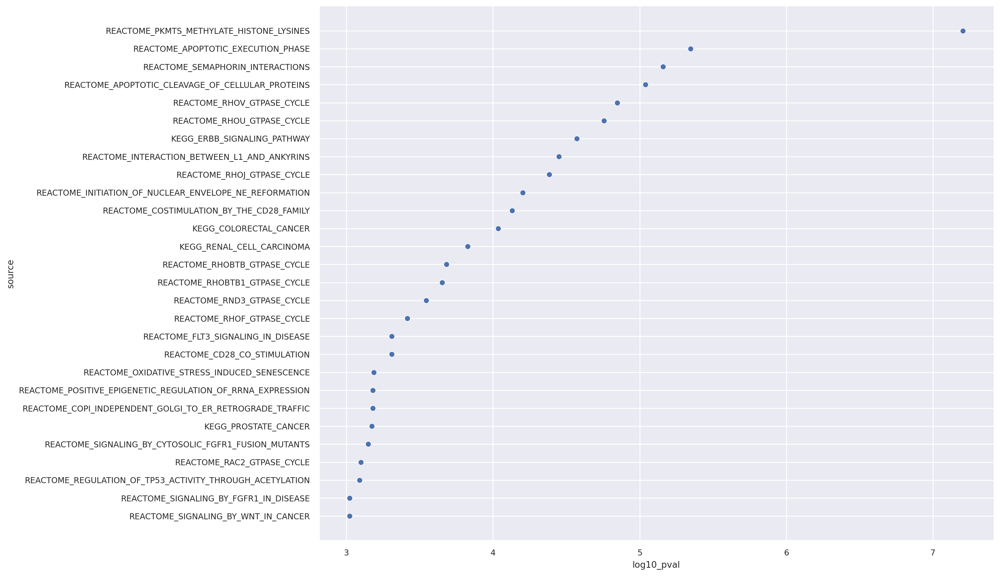

In [58]:
pthreshold = P_THRESHOLD
n_up = 0
n_bottom = N_TOP_GENES

estimate, pvals = dc.run_ora(mat=rank.T, net=curated, source='geneset', target='genesymbol', verbose=False, n_up=n_up, n_bottom=n_bottom)
ora = pd.concat([estimate, pvals]).T
ora.columns = ["estimate", "pvals"]
ora["log10_pval"] = -np.log10(ora["pvals"])
ora = ora.reset_index()

sns.set(font_scale=0.8)
height = 3+len(ora[ora.pvals < pthreshold])*0.2
ax = sns.relplot(data=ora[ora.pvals < pthreshold].sort_values(by="log10_pval", ascending=False), x="log10_pval", y="source", 
                 height=height, aspect=15/height, legend="auto")

In [59]:
ora[ora.source.str.contains("MECP2")]

,source,estimate,pvals,log10_pval
695,REACTOME_LOSS_OF_FUNCTION_OF_MECP2_IN_RETT_SYN...,-0.000000,1.000000,-0.000000
697,REACTOME_LOSS_OF_MECP2_BINDING_ABILITY_TO_THE_...,-0.000000,1.000000,-0.000000
713,REACTOME_MECP2_REGULATES_NEURONAL_RECEPTORS_AN...,1.178867,0.066242,1.178867
714,REACTOME_MECP2_REGULATES_TRANSCRIPTION_OF_NEUR...,-0.000000,1.000000,-0.000000
1005,REACTOME_REGULATION_OF_MECP2_EXPRESSION_AND_AC...,0.764141,0.172131,0.764141
1325,REACTOME_TRANSCRIPTIONAL_REGULATION_BY_MECP2,1.923273,0.011932,1.923273


In [60]:
ora[ora.pvals < 1].to_csv(os.path.join(result_folder, "neurons_HAvsCNT_funct_BOTTOM{}.csv".format(N_TOP_GENES)))

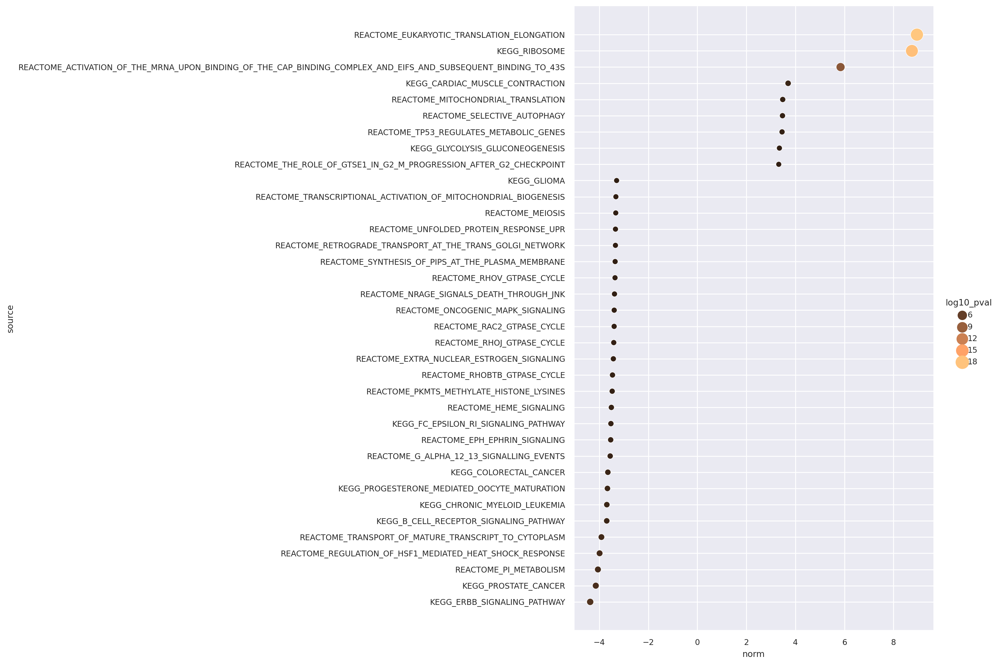

In [61]:
pthreshold = P_THRESHOLD

estimate, norm, pvals = dc.run_gsea(mat=rank.T, net=curated, source='geneset', target='genesymbol', verbose=False)
ora = pd.concat([estimate, norm, pvals]).T
ora.columns = ["estimate", "norm", "pvals"]
ora["log10_pval"] = -np.log10(ora["pvals"])
ora = ora.reset_index()

sns.set(font_scale=0.8)
maxv, minv = ora["log10_pval"].max(), ora["log10_pval"].min()
height = 3+len(ora[ora.pvals < pthreshold])*0.2
ax = sns.relplot(data=ora[ora.pvals < pthreshold].sort_values(by="norm", ascending=False), x="norm", y="source", size="log10_pval", 
                 sizes=(10,200), size_norm=(minv, maxv), 
                 hue="log10_pval", hue_norm=(minv, maxv), palette="copper", 
                 height=height, aspect=15/height, legend="auto")

In [62]:
ora[ora.pvals < 1].to_csv(os.path.join(result_folder, "neurons_HAvsCNT_funct_GSEA.csv"))

In [63]:
ora[ora.source.str.contains("MECP2")]

,source,estimate,norm,pvals,log10_pval
695,REACTOME_LOSS_OF_FUNCTION_OF_MECP2_IN_RETT_SYN...,-0.748546,-1.810800,0.070172,1.153838
697,REACTOME_LOSS_OF_MECP2_BINDING_ABILITY_TO_THE_...,-0.806919,-1.549322,0.121304,0.916124
713,REACTOME_MECP2_REGULATES_NEURONAL_RECEPTORS_AN...,-0.842635,-1.580423,0.114010,0.943057
714,REACTOME_MECP2_REGULATES_TRANSCRIPTION_OF_NEUR...,-0.695981,-1.227410,0.219669,0.658232
1005,REACTOME_REGULATION_OF_MECP2_EXPRESSION_AND_AC...,-0.809306,-2.654684,0.007938,2.100274
1325,REACTOME_TRANSCRIPTIONAL_REGULATION_BY_MECP2,-0.818951,-2.924194,0.003453,2.461741


# REACTOME_TRANSCRIPTIONAL_REGULATION_BY_MECP2 score

In [64]:
MECP2_list = curated[curated.geneset == "REACTOME_TRANSCRIPTIONAL_REGULATION_BY_MECP2"].genesymbol.tolist()
len(MECP2_list)

61

In [65]:
sc.tl.score_genes(adata, MECP2_list, score_name='MECP2_ptw')

computing score 'MECP2_ptw'
    finished: added
    'MECP2_ptw', score of gene set (adata.obs).
    993 total control genes are used. (0:00:01)


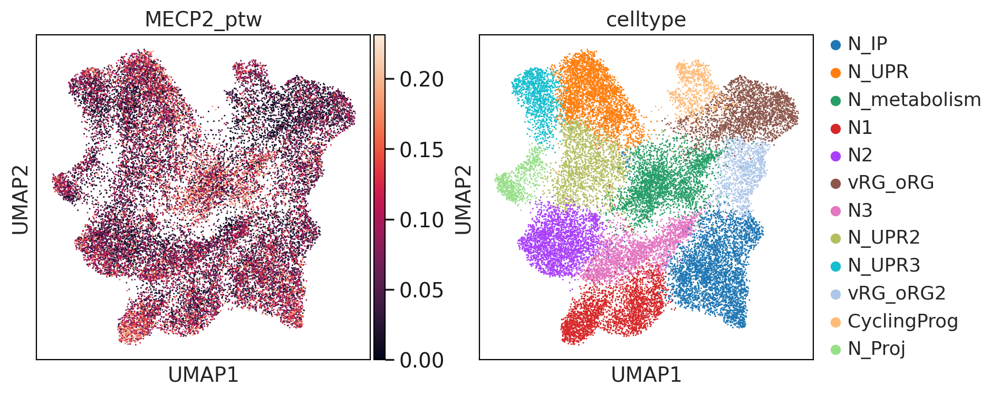

In [66]:
sc.settings.set_figure_params(dpi=100, facecolor='white')
sc.pl.umap(adata, color=['MECP2_ptw', 'celltype'], vmin=0., vmax='p99')

In [67]:
N_clusters = adata[adata.obs["celltype"].isin(['N1', 'N2', 'N3'])].copy()
N_clusters

/usr/local/lib/python3.8/dist-packages/anndata/compat/__init__.py:211: FutureWarning: During AnnData slicing, found matrix at .uns['triku_params']['None']['knn_array'] that happens to be dimensioned at n_obs×n_obs (25321×25321).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(


AnnData object with n_obs × n_vars = 7693 × 16240
    obs: 'batch_id', 'sample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_mito', 'pct_counts_mito', 'total_counts_toxo', 'pct_counts_toxo', 'total_counts_human', 'pct_counts_human', 'total_counts_HA', 'pct_counts_HA', 'total_counts_Mecp2', 'pct_counts_Mecp2', 'n_genes', 'n_counts', 'umap_density_batch_id', 'Leiden_03', 'Leiden_04', 'Leiden_05', 'Leiden_06', 'infected', 'batch_infect', 'celltype', 'sample_infect', 'MECP2_ptw'
    var: 'gene_ids', 'feature_types', 'ribo', 'mito', 'toxo', 'human', 'HA', 'Mecp2', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'triku_distance', 'triku_distance_uncorrected', 'triku_highly_variable'
    uns: 'Leiden_03_colors', 'Leiden_04_colors', 'Leiden_05_colors', 'Leiden_06_colors', 'batch_id_colors', 'celltype_colors', 'diffmap_evals', 'draw_graph', 'infected_colors', 'leiden', 'neighbors', 'pca', 'rank_L06

In [68]:
N_clusters.layers['scaled'] = sc.pp.scale(N_clusters, copy=True).X

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


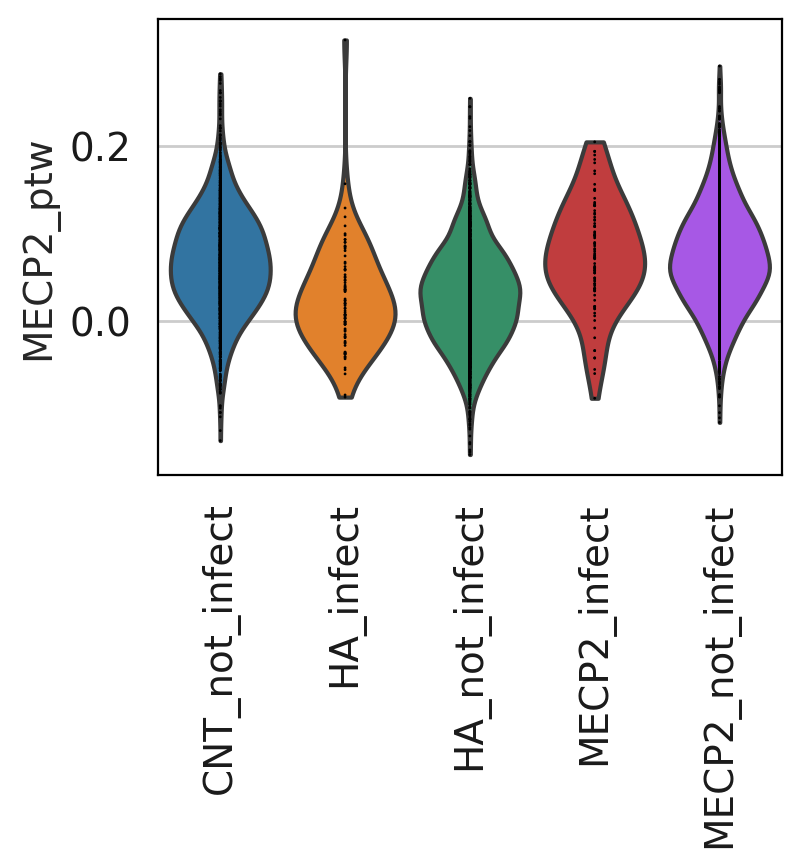

In [69]:
fig, ax = plt.subplots(figsize=(4,3))
sc.pl.violin(N_clusters, ['MECP2_ptw'], groupby='batch_infect', multi_panel=True, jitter=False, log=False, rotation=90., ax=ax)
plt.show()

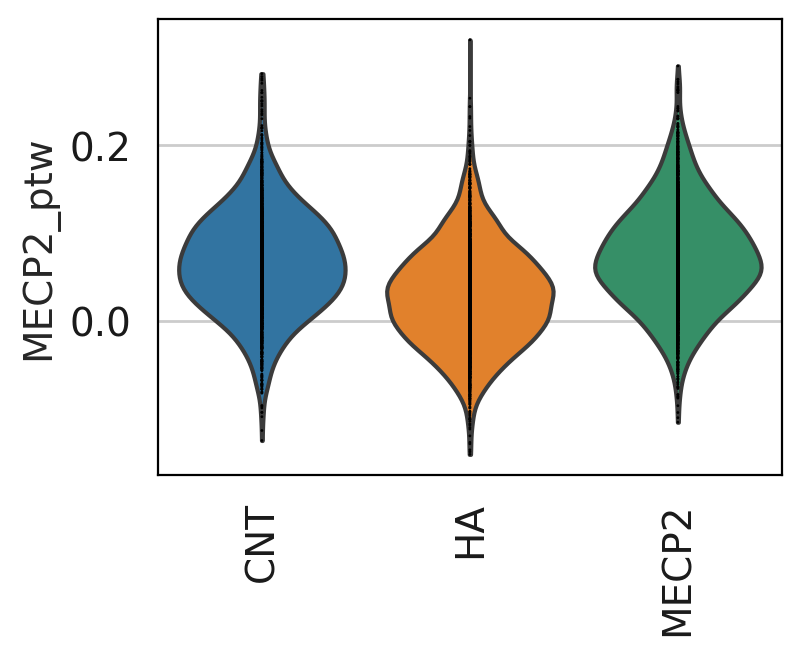

In [70]:
sc.settings.set_figure_params(dpi=100, facecolor='white')
fig, ax = plt.subplots(figsize=(4,3))
sc.pl.violin(N_clusters, ['MECP2_ptw'], groupby='batch_id', multi_panel=True, jitter=False, log=False, rotation=90., ax=ax)
plt.show()

/usr/local/lib/python3.8/dist-packages/anndata/compat/__init__.py:211: FutureWarning: During AnnData slicing, found matrix at .uns['triku_params']['None']['knn_array'] that happens to be dimensioned at n_obs×n_obs (25321×25321).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(
Trying to set attribute `.uns` of view, copying.


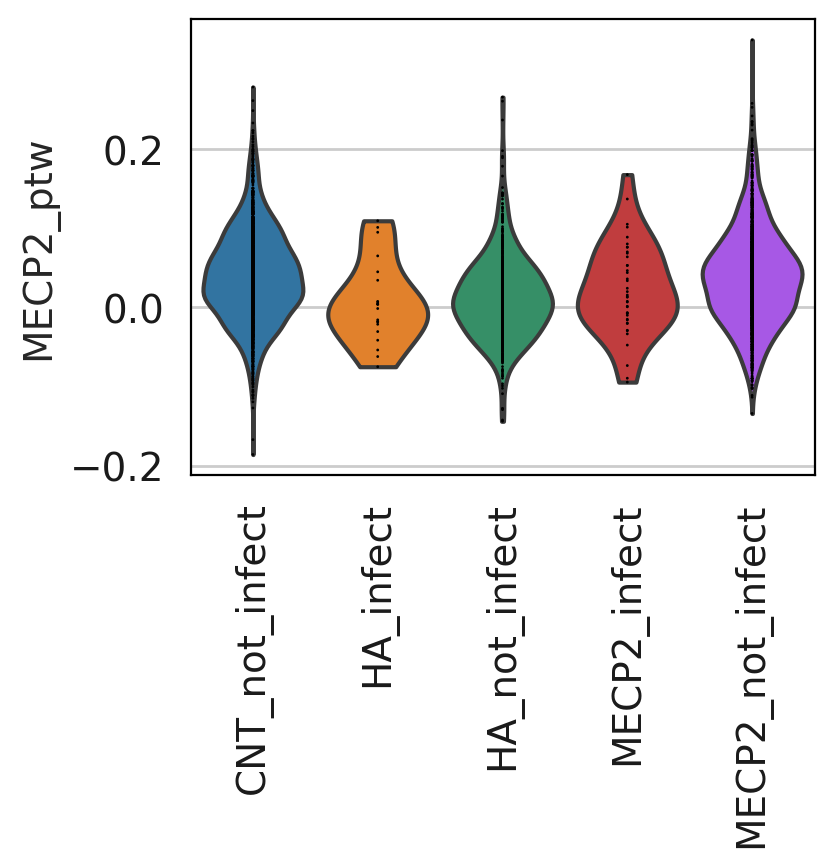

In [71]:
fig, ax = plt.subplots(figsize=(4,3))
sc.pl.violin(adata[adata.obs["celltype"].isin(['CyclingProg', 'vRG_oRG', 'vRG_oRG2'])], ['MECP2_ptw'], groupby='batch_infect', multi_panel=True, jitter=False, log=False, rotation=90., ax=ax)
plt.show()

# 10. Transcription factor activity inference

In [72]:
net = dc.get_dorothea(organism='human', levels=['A','B','C'])
net

,source,confidence,target,weight
0,ETS1,A,IL12B,1.000000
1,RELA,A,IL6,1.000000
2,MITF,A,BCL2A1,-1.000000
3,E2F1,A,TRERF1,1.000000
4,MITF,A,BCL2,1.000000
...,...,...,...,...
32272,IKZF1,C,PTK2B,0.333333
32273,IKZF1,C,PRKCB,0.333333
32274,IKZF1,C,PREX1,0.333333
32275,IRF4,C,SLAMF7,0.333333


In [73]:
dc.run_mlm(mat=adata, net=net, source='source', target='target', weight='weight', verbose=True, use_raw=False)

Running mlm on mat with 25321 samples and 16240 targets for 285 sources.


100%|██████████| 3/3 [00:28<00:00,  9.39s/it]


In [74]:
acts = dc.get_acts(adata, obsm_key='mlm_estimate')
acts

AnnData object with n_obs × n_vars = 25321 × 285
    obs: 'batch_id', 'sample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_mito', 'pct_counts_mito', 'total_counts_toxo', 'pct_counts_toxo', 'total_counts_human', 'pct_counts_human', 'total_counts_HA', 'pct_counts_HA', 'total_counts_Mecp2', 'pct_counts_Mecp2', 'n_genes', 'n_counts', 'umap_density_batch_id', 'Leiden_03', 'Leiden_04', 'Leiden_05', 'Leiden_06', 'infected', 'batch_infect', 'celltype', 'sample_infect', 'MECP2_ptw'
    uns: 'Leiden_03_colors', 'Leiden_04_colors', 'Leiden_05_colors', 'Leiden_06_colors', 'batch_id_colors', 'celltype_colors', 'diffmap_evals', 'draw_graph', 'infected_colors', 'leiden', 'neighbors', 'pca', 'rank_L06', 'sample_id_colors', 'triku_params', 'umap', 'umap_density_batch_id_params'
    obsm: 'X_diffmap', 'X_draw_graph_fa', 'X_pca', 'X_umap', 'mlm_estimate', 'mlm_pvals'

In [75]:
mean_acts = dc.summarize_acts(acts, groupby='batch_id', min_std=0.3)
mean_acts

,ARID2,ATF6,FOXA1,FOXP1,HIF1A,HSF1,KMT2A,SREBF1,STAT1,ZBTB11,ZBTB33,ZNF384,ZNF639
CNT,2.082448,2.349088,0.370684,1.371972,3.338077,5.139609,1.635965,1.725007,-2.026128,0.328582,3.395124,1.286927,2.418909
HA,1.459183,1.291593,-0.538242,0.943727,4.000520,3.589995,0.888718,1.897541,-2.568468,-0.311991,2.923030,0.849044,1.740103
MECP2,2.240344,2.325367,0.323853,1.686227,4.663599,2.720489,2.043562,2.556866,-2.071651,0.143317,3.489440,1.441903,2.485695


In [76]:
mean_acts = dc.summarize_acts(acts, groupby="celltype", min_std=0.5)
mean_acts

,ATF6,E2F4,EGR1,ETV4,FOXM1,HIF1A,HOXB13,HSF1,JUND,KLF13,...,RELA,REST,SP1,SREBF1,TFDP1,TP53,TWIST1,USF1,VDR,ZEB2
CyclingProg,2.620402,8.095869,1.537513,0.207107,2.233003,4.657357,0.174052,3.455504,0.373226,-0.907429,...,-1.701437,-1.121748,1.784661,0.965139,3.582797,0.895905,0.620666,0.585052,2.952189,2.955139
N1,1.630055,2.733415,3.013477,-0.726734,-2.253345,4.324349,1.419356,2.197616,2.012624,-0.783658,...,-0.848080,0.074261,0.283080,1.542259,1.721801,0.444584,2.810132,-0.430414,1.795924,0.902549
N2,1.744434,2.954993,3.214544,-0.887499,-2.307182,4.229324,1.830920,2.561728,2.166177,-0.909762,...,-0.633731,-0.007441,0.259450,3.037207,1.676747,0.103847,2.393288,-0.596760,1.947188,0.707311
N3,1.838634,2.793952,3.027805,-0.746603,-2.344683,4.242921,1.343614,2.284712,2.013729,-0.928498,...,-1.149116,-0.103829,0.258033,1.904308,1.734136,0.164616,2.734369,-0.370556,2.009600,0.908652
N_IP,1.934791,2.875287,2.786561,-0.935980,-2.381068,5.161908,1.238716,2.077833,2.002244,-1.108857,...,-1.233416,-0.202063,0.401319,2.788895,1.849575,0.201662,2.838008,-0.475709,2.108782,1.006064
N_Proj,2.514812,2.864290,3.540523,-0.917966,-2.121880,3.850448,1.539388,3.893828,1.814679,-0.732831,...,-0.187602,0.610513,0.516327,2.549691,1.655858,-0.164420,1.687814,-0.673654,1.849210,0.619666
N_UPR,2.221760,2.009174,2.141403,-0.837554,-1.798916,2.232124,1.428170,9.344622,1.319236,0.327354,...,0.268834,-0.059930,0.787626,1.989725,1.156549,-0.146507,1.444890,-1.028576,2.100279,0.696053
N_UPR2,2.364439,2.771214,2.562987,-0.767561,-1.967445,2.964995,1.279698,6.173024,1.910126,-0.301995,...,-0.647871,-0.012002,0.723044,1.873153,1.340114,0.075918,1.887780,-0.798110,2.201437,0.657082
N_UPR3,2.313805,2.163780,2.559830,-0.899284,-1.811339,2.361600,1.253960,9.679369,1.382466,0.368677,...,0.343910,0.200847,0.995815,1.951280,1.251861,-0.390618,1.044468,-1.139828,2.213778,0.482913
N_metabolism,1.268014,1.607636,1.560722,-0.234814,-1.608099,2.432329,1.304214,2.390666,1.643912,-0.828316,...,-0.502809,0.155878,0.494632,1.748828,0.779562,0.450464,1.631231,-0.017126,0.839601,1.174551


/usr/local/lib/python3.8/dist-packages/anndata/compat/__init__.py:211: FutureWarning: During AnnData slicing, found matrix at .uns['triku_params']['None']['knn_array'] that happens to be dimensioned at n_obs×n_obs (25321×25321).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(


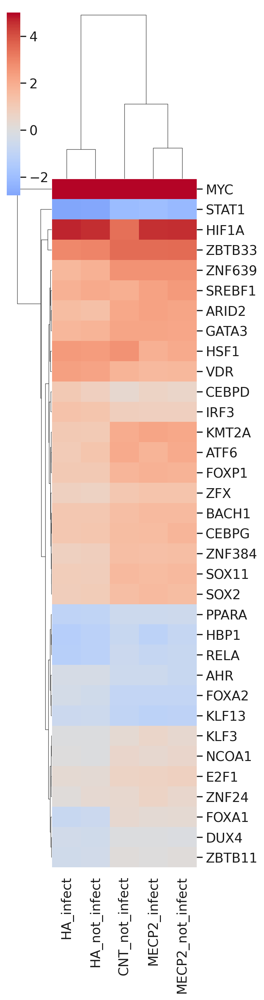

In [77]:
mean_acts = dc.summarize_acts(acts[acts.obs["celltype"].isin(['N1', 'N2', 'N3'])], groupby="batch_infect", min_std=0.2)
sns.clustermap(mean_acts.T, center=0, vmax=5, cmap='coolwarm', figsize=(4, 15))
plt.show()

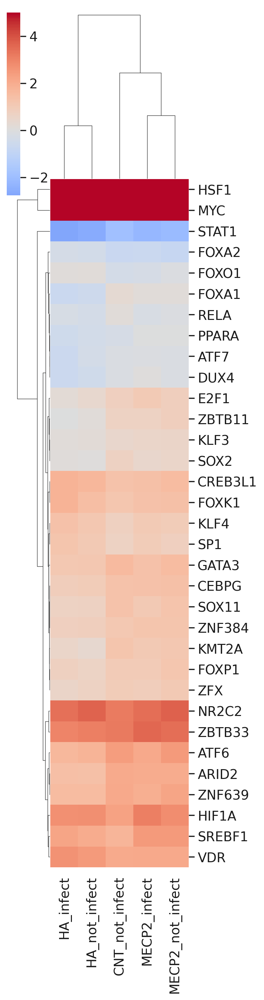

In [78]:
mean_acts = dc.summarize_acts(acts[acts.obs["celltype"].isin(['N_UPR', 'N_UPR2', 'N_UPR3'])], groupby="batch_infect", min_std=0.2)
sns.clustermap(mean_acts.T, center=0, vmax=5, cmap='coolwarm', figsize=(4, 15))
plt.show()

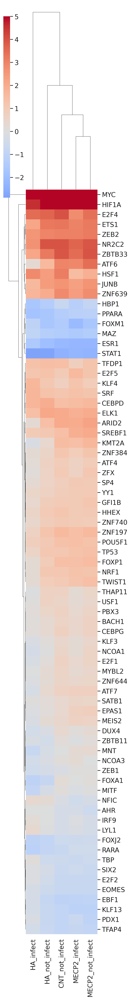

In [79]:
mean_acts = dc.summarize_acts(acts[acts.obs["celltype"].isin(['CyclingProg', 'vRG_oRG', 'vRG_oRG2'])], groupby="batch_infect", min_std=0.2)
sns.clustermap(mean_acts.T, center=0, vmax=5, cmap='coolwarm', figsize=(4, 30))
plt.show()

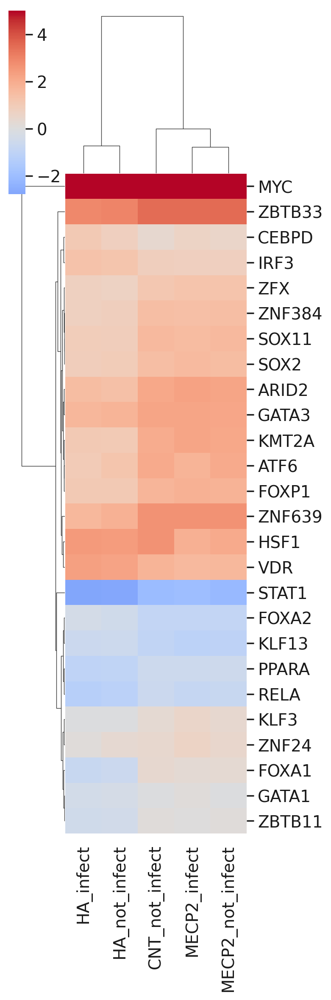

In [80]:
mean_acts = dc.summarize_acts(acts[(acts.obs.infected == "True") & (acts.obs["celltype"].isin(["N1", "N2", "N3"]))], groupby='batch_id', min_std=0.3)
tf = mean_acts.columns
mean_acts = dc.summarize_acts(acts[acts.obs["celltype"].isin(['N1', 'N2', 'N3'])], groupby="batch_infect", min_std=0.0)
mean_acts = mean_acts[tf]
sns.clustermap(mean_acts.T, center=0, vmax=5, cmap='coolwarm', figsize=(4, 12))
plt.show()

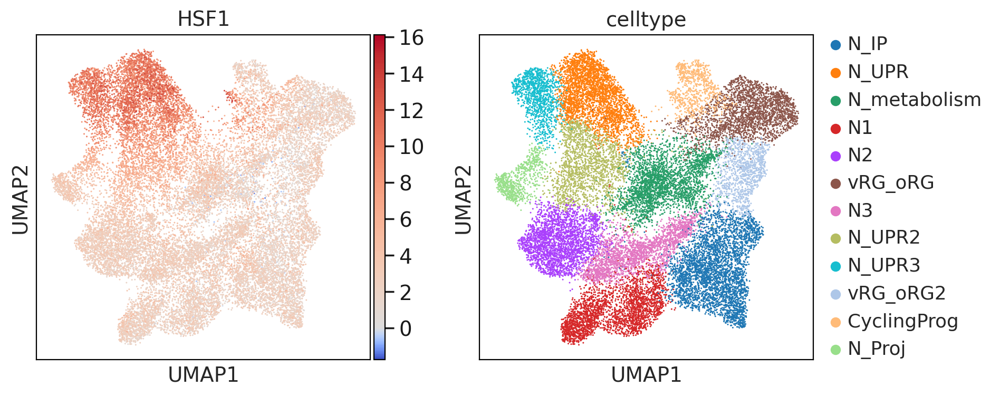

In [81]:
sc.settings.set_figure_params(dpi=100, facecolor='white')
sc.pl.umap(acts, color=['HSF1', 'celltype'], cmap='coolwarm', vcenter=0)

# Saving

## Timestamp finished computations

In [82]:
print(datetime.now())

2022-12-02 13:06:03.326072


## Save python and html version of notebook

In [83]:
nb_fname = ipynbname.name()
nb_fname

'03-differential_analysis'

In [84]:
%%bash -s "$nb_fname"
sleep 120
jupyter nbconvert "$1".ipynb --to="python" --ClearOutputPreprocessor.enabled=True
jupyter nbconvert "$1".ipynb --to="html"

[NbConvertApp] Converting notebook 03-differential_analysis.ipynb to python
[NbConvertApp] Writing 15799 bytes to 03-differential_analysis.py
[NbConvertApp] Converting notebook 03-differential_analysis.ipynb to html
[NbConvertApp] Writing 18607674 bytes to 03-differential_analysis.html
